# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper
import numpy as np

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

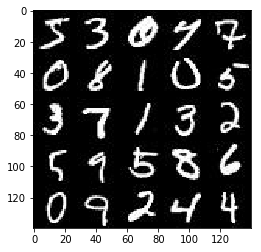

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

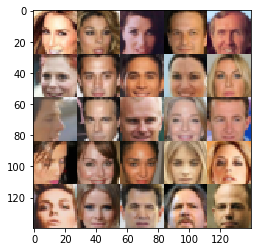

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


C:\Users\el-zno00\AppData\Local\Continuum\Anaconda3\envs\dlnd-tf-lab\lib\site-packages\ipykernel\__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function

    real_images = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name="input_real")
    z_data = tf.placeholder(tf.float32,[None,z_dim], name = "input_z" )
    learning_rate = tf.placeholder(tf.float32, name = "learning_rate")
    return real_images, z_data, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    n_units = 128
    alpha = 0.2
    Dim = images.shape
    FlatDims = Dim[1]*Dim[2]*Dim[3]

    
    # NYZ - Question - This statement fails-- but explicit definitions of dimensions work
    #images_flat = tf.reshape(images,[-1, FlatDims ])
    #images_flat = tf.reshape(images,[-1, 28*28*1 ])
    #print(images_flat)
    with tf.variable_scope("discriminator", reuse = reuse):
        
        # first convolution layer
        x1 = tf.layers.conv2d(images, 64, 5, strides = 2, padding = 'same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        #x1 = tf.nn.dropout(x1, 0.3)
        #x1 = tf.layers.batch_normalization(x1, training = True)
        x1 = tf.maximum(alpha * x1, x1)
        # Adding dropout
        
        
        x2 = tf.layers.conv2d(images, 128, 5, strides = 2, padding = 'same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        #x2 = tf.nn.dropout(x2, 0.3)
        x2 = tf.layers.batch_normalization(x2, training = True)
        x2 = tf.maximum(alpha * x2, x2)
        # Adding dropout
        
        
        x3 = tf.layers.conv2d(images, 256, 5, strides = 2, padding = 'same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        #x3 = tf.nn.dropout(x3, 0.3)
        x3 = tf.layers.batch_normalization(x3, training = True)
        x3 = tf.maximum(alpha * x3, x3)
        x3_flat = tf.reshape(x3,[-1, 4*4*256])
        
        logits = tf.layers.dense(x3_flat,1)
        out = tf.sigmoid(logits)
        
        
        
#         #print("x2", x2)
#         logits = tf.layers.dense(x3_flat, n_units, activation=None)
#         #h1 = tf.layers.dense(images_flat, n_units, activation=None)
#         # Leaky ReLU
#         logits = tf.maximum(alpha * logits, logits)
#         out = tf.sigmoid(logits)
        
#         logits = tf.layers.dense(logits, 1, activation=None)
#         out = tf.sigmoid(logits)
        
        #print("OUT", out)
        #print("LOGITS",logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [9]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
        # Fully connected
    
    #print(z)
#     alpha = 0.2
#     with tf.variable_scope('generator', reuse = not is_train):
#         fc1 = tf.layers.dense(z, 4*4*784)
#         #print("fc1===",fc1)

#         x1 = tf.reshape(fc1, (-1, 7, 7, 256))
#         x1 = tf.layers.batch_normalization(x1, training=is_train)
#         x1 = tf.nn.relu(x1)

#         #print(x1)
#         # Second layer 
#         x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding='SAME')
#         x2 = tf.layers.batch_normalization(x2, training=is_train)
#         x2 = tf.nn.relu(x2)

#         # Ouput layer
#         logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='SAME')
#         out = tf.tanh(logits)
        
#         #print("OUT", out)

# #         fc1 = tf.layers.dense(z, 28*28*5)
# #         out = tf.tanh(fc1)
# #         out = tf.reshape(out,[-1, 28,28,5])
# #         print(out)
        
# #         #logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='SAME')
# #         #out = tf.tanh(logits)
    
#     return out


    alpha = 0.2

    with tf.variable_scope('generator', reuse = not is_train):

        x1 = tf.layers.dense(z, 7*7*512)

        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.dropout(x1, 0.5, training = True)
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same', kernel_initializer = tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.dropout(x2, 0.5, training = True)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same', kernel_initializer = tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.dropout(x3, 0.5, training = True)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)

        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='same', kernel_initializer = tf.contrib.layers.xavier_initializer())
        
        out = tf.tanh(logits)
        
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)




Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [10]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """

    #smooth = 0.1


    # Build the model
    g_model = generator(input_z, out_channel_dim)
    # g_model is the generator output

    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    
    d_loss_real = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                          labels=tf.ones_like(d_model_real)* np.random.uniform(0.7, 1.2)))
    d_loss_fake = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                          labels=tf.zeros_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake

    g_loss = tf.reduce_mean(
             tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                     labels=tf.ones_like(d_model_fake)))
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
# def model_opt(d_loss, g_loss, learning_rate, beta1):
#     """
#     Get optimization operations
#     :param d_loss: Discriminator loss Tensor
#     :param g_loss: Generator loss Tensor
#     :param learning_rate: Learning Rate Placeholder
#     :param beta1: The exponential decay rate for the 1st moment in the optimizer
#     :return: A tuple of (discriminator training operation, generator training operation)
#     """
    # TODO: Implement Function


# Get the trainable_variables, split into G and D parts
#     t_vars = tf.trainable_variables()
#     g_vars = [var for var in t_vars if var.name.startswith('generator')]
#     d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
#     with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
#         d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1).minimize(d_loss, var_list=d_vars)
#         g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1).minimize(g_loss, var_list=g_vars)
    
    
#     return d_train_opt, g_train_opt


def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function


# Get the trainable_variables, split into G and D parts
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):

        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1).minimize(g_loss, var_list=g_vars)
    
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [12]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [13]:
# def train(epoch_count, batch_size, z_dim, learning_rate1, beta1, get_batches, data_shape, data_image_mode):
#     """
#     Train the GAN
#     :param epoch_count: Number of epochs
#     :param batch_size: Batch Size
#     :param z_dim: Z dimension
#     :param learning_rate: Learning Rate
#     :param beta1: The exponential decay rate for the 1st moment in the optimizer
#     :param get_batches: Function to get batches
#     :param data_shape: Shape of the data
#     :param data_image_mode: The image mode to use for images ("RGB" or "L")
#     """
#     # TODO: Build Model
#     #print (data_shape)
    
#     input_real, input_z, learning_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
#     d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
#     d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)

    
    
#     with tf.Session() as sess:
#         sess.run(tf.global_variables_initializer())
#         for epoch_i in range(epoch_count):
#             batch_num = 0
#             for batch_images in get_batches(batch_size):
#                 batch_num = batch_num+1
#                 # TODO: Train Model
#                 batch_images = batch_images*2 #- 1         
#             # Sample random noise for G
#                 batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
#                 _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate: learning_rate1})
#                 #print("PASSED")
#                 _ = sess.run(g_train_opt, feed_dict={input_z: batch_z, learning_rate: learning_rate1})
#                 #print("PASSED")
                
        
#         # At the end of each epoch, get the losses and print them out

#                 if batch_num % 20 == 0:
#                     train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
#                     train_loss_g = g_loss.eval({input_z: batch_z})
#                     print("Epoch {}/{}...".format(epoch_i+1, epochs), "Batch{}...".format(batch_num),
#                           "Discriminator Loss: {:.4f}...".format(train_loss_d),
#                           "Generator Loss: {:.4f}".format(train_loss_g))
#                     _ = show_generator_output(sess, 5, input_z, data_shape[3], data_image_mode)
def train(epoch_count, batch_size, z_dim, learning_rate1, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #print (data_shape)

    input_real, input_z, learning_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)



    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            batch_num = 0
            for batch_images in get_batches(batch_size):
                batch_num = batch_num+1
                # TODO: Train Model
                batch_images = batch_images*2 #- 1         
            # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate: learning_rate1})
                #print("PASSED")
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate: learning_rate1})
                #print("PASSED")


        # At the end of each epoch, get the losses and print them out

                if batch_num % 100 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{}...".format(epoch_i+1, epochs), "Batch{}...".format(batch_num),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    _ = show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)

                


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

./data
Epoch 1/2... Batch100... Discriminator Loss: 1.4002... Generator Loss: 0.7563


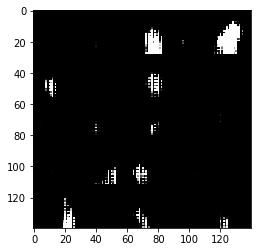

Epoch 1/2... Batch200... Discriminator Loss: 1.3506... Generator Loss: 1.4582


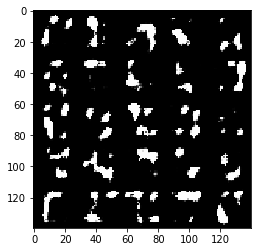

Epoch 1/2... Batch300... Discriminator Loss: 1.2300... Generator Loss: 1.0504


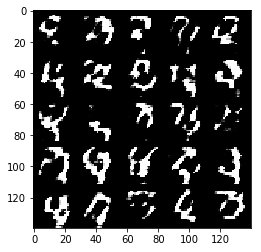

Epoch 1/2... Batch400... Discriminator Loss: 1.3552... Generator Loss: 1.6435


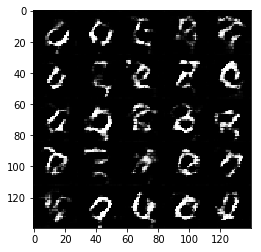

Epoch 1/2... Batch500... Discriminator Loss: 1.3039... Generator Loss: 0.9935


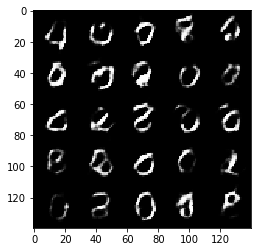

Epoch 1/2... Batch600... Discriminator Loss: 1.3338... Generator Loss: 0.8806


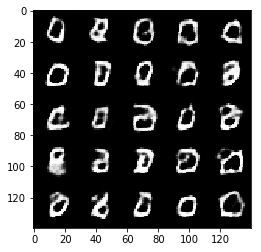

Epoch 1/2... Batch700... Discriminator Loss: 1.2867... Generator Loss: 1.0634


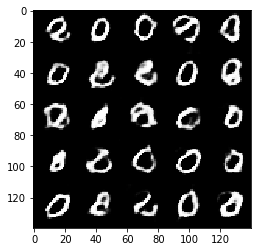

Epoch 1/2... Batch800... Discriminator Loss: 1.3093... Generator Loss: 0.9844


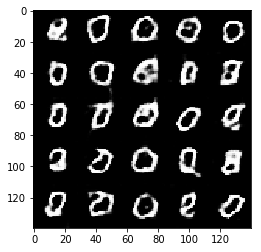

Epoch 1/2... Batch900... Discriminator Loss: 1.3040... Generator Loss: 0.9326


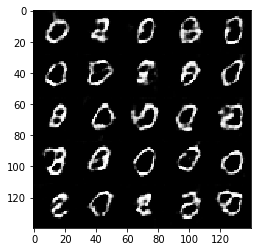

Epoch 1/2... Batch1000... Discriminator Loss: 1.2901... Generator Loss: 1.1034


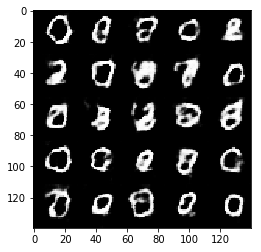

Epoch 1/2... Batch1100... Discriminator Loss: 1.2954... Generator Loss: 1.1239


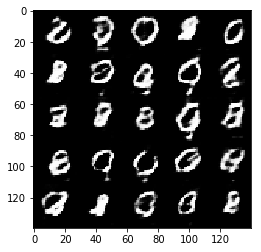

Epoch 1/2... Batch1200... Discriminator Loss: 1.2990... Generator Loss: 1.0792


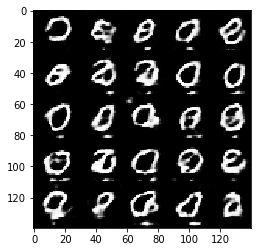

Epoch 1/2... Batch1300... Discriminator Loss: 1.2942... Generator Loss: 0.9991


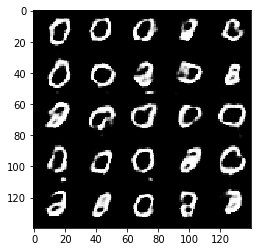

Epoch 1/2... Batch1400... Discriminator Loss: 1.3034... Generator Loss: 0.9017


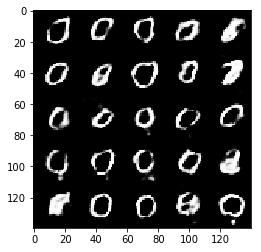

Epoch 1/2... Batch1500... Discriminator Loss: 1.2921... Generator Loss: 1.0636


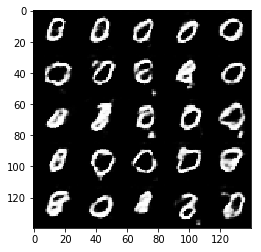

Epoch 1/2... Batch1600... Discriminator Loss: 1.3054... Generator Loss: 1.1001


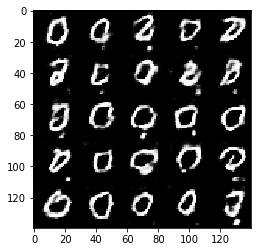

Epoch 1/2... Batch1700... Discriminator Loss: 1.3032... Generator Loss: 0.9835


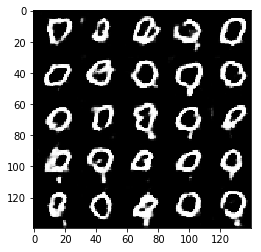

Epoch 1/2... Batch1800... Discriminator Loss: 1.2939... Generator Loss: 0.9935


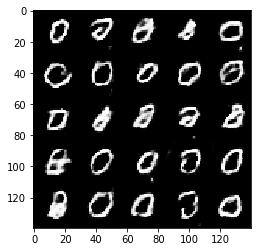

Epoch 2/2... Batch100... Discriminator Loss: 1.3000... Generator Loss: 0.9839


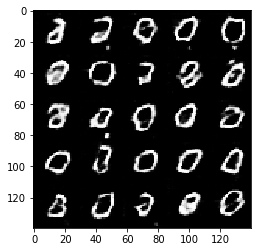

Epoch 2/2... Batch200... Discriminator Loss: 1.2932... Generator Loss: 1.1410


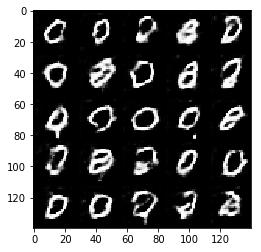

Epoch 2/2... Batch300... Discriminator Loss: 1.2889... Generator Loss: 1.0590


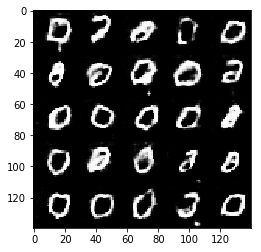

Epoch 2/2... Batch400... Discriminator Loss: 1.3223... Generator Loss: 1.0229


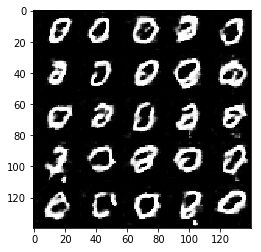

Epoch 2/2... Batch500... Discriminator Loss: 1.2869... Generator Loss: 1.1024


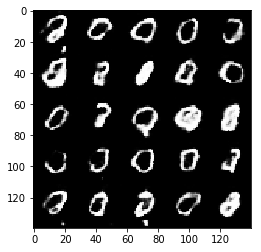

Epoch 2/2... Batch600... Discriminator Loss: 1.3184... Generator Loss: 1.0699


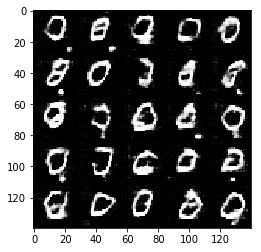

Epoch 2/2... Batch700... Discriminator Loss: 1.2942... Generator Loss: 0.9667


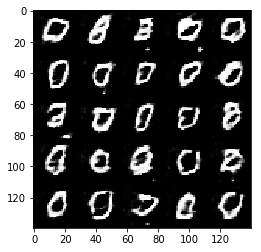

Epoch 2/2... Batch800... Discriminator Loss: 1.3047... Generator Loss: 1.1150


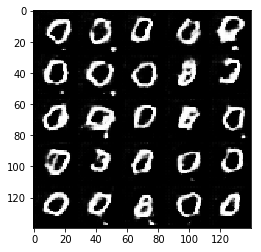

Epoch 2/2... Batch900... Discriminator Loss: 1.2966... Generator Loss: 1.0436


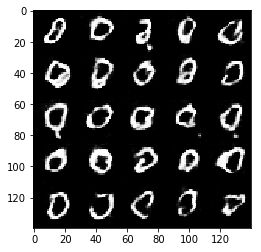

Epoch 2/2... Batch1000... Discriminator Loss: 1.2989... Generator Loss: 0.9545


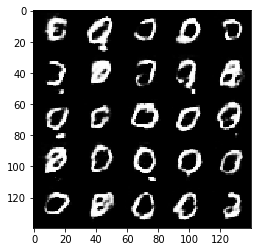

Epoch 2/2... Batch1100... Discriminator Loss: 1.3131... Generator Loss: 0.9305


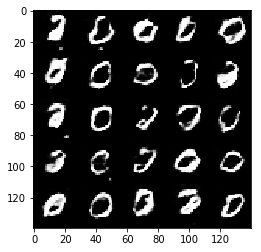

Epoch 2/2... Batch1200... Discriminator Loss: 1.2948... Generator Loss: 1.0847


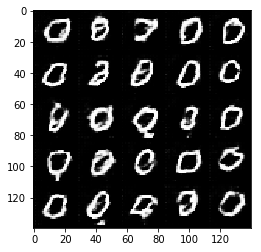

Epoch 2/2... Batch1300... Discriminator Loss: 1.2896... Generator Loss: 1.0914


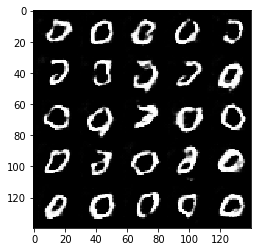

Epoch 2/2... Batch1400... Discriminator Loss: 1.2929... Generator Loss: 1.0119


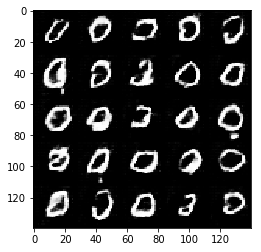

Epoch 2/2... Batch1500... Discriminator Loss: 1.2979... Generator Loss: 1.1093


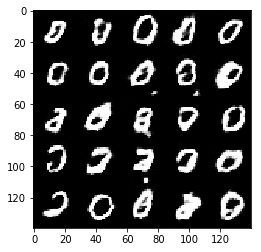

Epoch 2/2... Batch1600... Discriminator Loss: 1.3000... Generator Loss: 0.9432


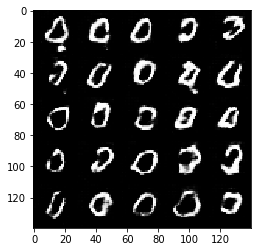

Epoch 2/2... Batch1700... Discriminator Loss: 1.3198... Generator Loss: 1.1613


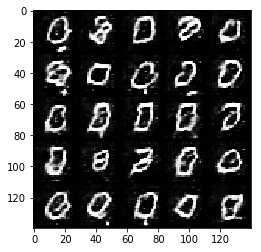

Epoch 2/2... Batch1800... Discriminator Loss: 1.2913... Generator Loss: 1.1157


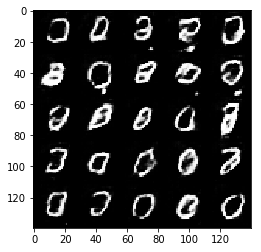

In [14]:
batch_size = 32
z_dim = 100
learning_rate = 0.004
beta1 = 0.2



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2
print(data_dir)
mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Start Generation
Epoch 1/2... Batch100... Discriminator Loss: 1.4165... Generator Loss: 0.7936


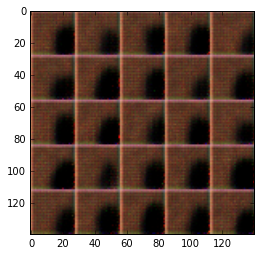

Epoch 1/2... Batch200... Discriminator Loss: 1.3535... Generator Loss: 0.8879


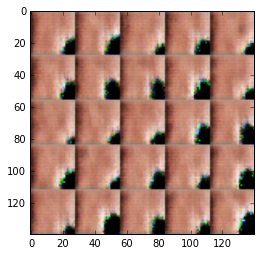

Epoch 1/2... Batch300... Discriminator Loss: 1.3499... Generator Loss: 0.8196


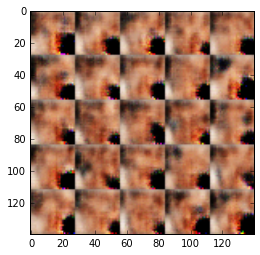

Epoch 1/2... Batch400... Discriminator Loss: 1.3242... Generator Loss: 0.9197


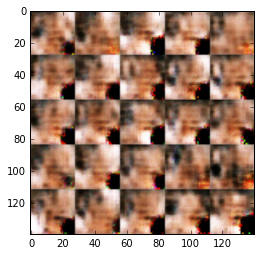

Epoch 1/2... Batch500... Discriminator Loss: 1.4308... Generator Loss: 0.8304


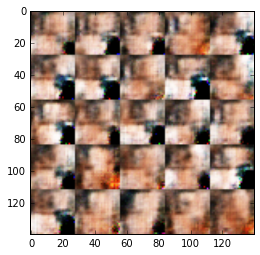

Epoch 1/2... Batch600... Discriminator Loss: 1.3872... Generator Loss: 0.8584


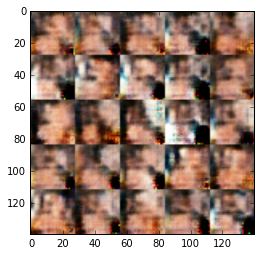

Epoch 1/2... Batch700... Discriminator Loss: 1.3732... Generator Loss: 0.8168


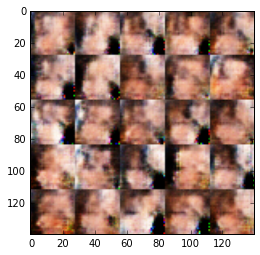

Epoch 1/2... Batch800... Discriminator Loss: 1.4060... Generator Loss: 0.6672


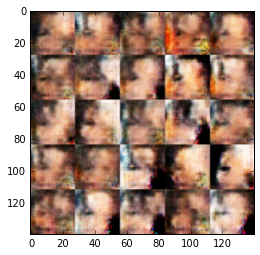

Epoch 1/2... Batch900... Discriminator Loss: 1.4384... Generator Loss: 0.7006


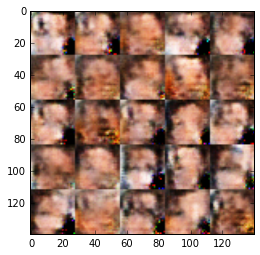

Epoch 1/2... Batch1000... Discriminator Loss: 1.3926... Generator Loss: 0.8173


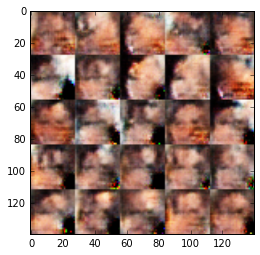

Epoch 1/2... Batch1100... Discriminator Loss: 1.3763... Generator Loss: 0.7565


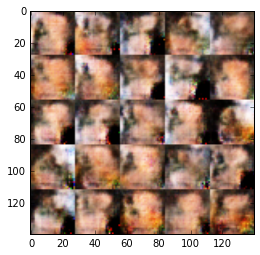

Epoch 1/2... Batch1200... Discriminator Loss: 1.4334... Generator Loss: 0.6418


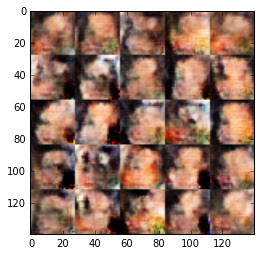

Epoch 1/2... Batch1300... Discriminator Loss: 1.3962... Generator Loss: 1.0138


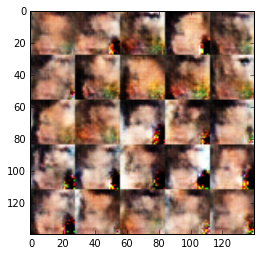

Epoch 1/2... Batch1400... Discriminator Loss: 1.3928... Generator Loss: 0.8928


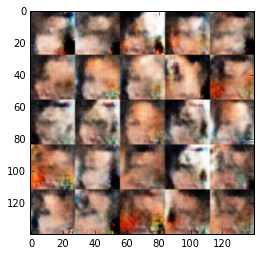

Epoch 1/2... Batch1500... Discriminator Loss: 1.3734... Generator Loss: 0.8046


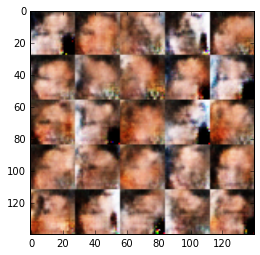

Epoch 1/2... Batch1600... Discriminator Loss: 1.3736... Generator Loss: 0.8764


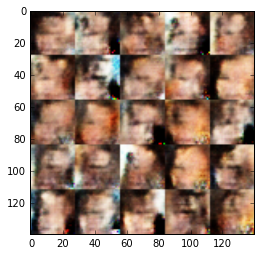

Epoch 1/2... Batch1700... Discriminator Loss: 1.3834... Generator Loss: 0.8070


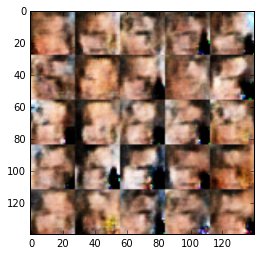

Epoch 1/2... Batch1800... Discriminator Loss: 1.3737... Generator Loss: 0.9118


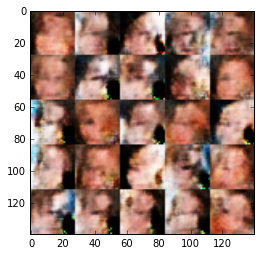

Epoch 1/2... Batch1900... Discriminator Loss: 1.3739... Generator Loss: 0.7774


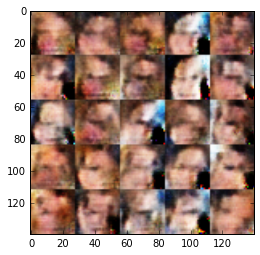

Epoch 1/2... Batch2000... Discriminator Loss: 1.3868... Generator Loss: 0.9380


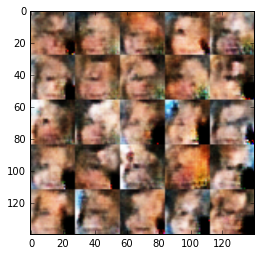

Epoch 1/2... Batch2100... Discriminator Loss: 1.3707... Generator Loss: 0.7995


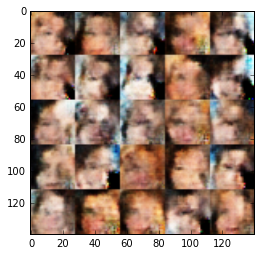

Epoch 1/2... Batch2200... Discriminator Loss: 1.3649... Generator Loss: 0.8752


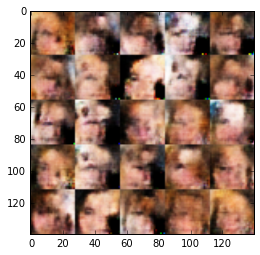

Epoch 1/2... Batch2300... Discriminator Loss: 1.3806... Generator Loss: 0.9195


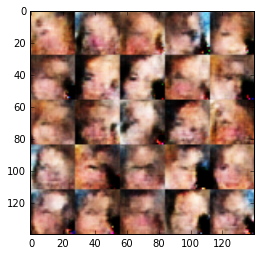

Epoch 1/2... Batch2400... Discriminator Loss: 1.3772... Generator Loss: 0.8605


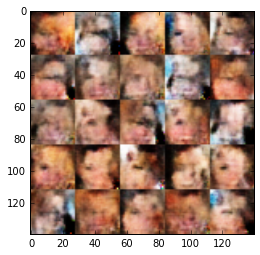

Epoch 1/2... Batch2500... Discriminator Loss: 1.4127... Generator Loss: 0.8678


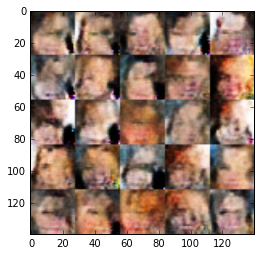

Epoch 1/2... Batch2600... Discriminator Loss: 1.3959... Generator Loss: 0.8446


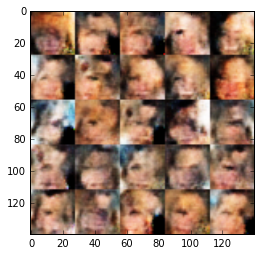

Epoch 1/2... Batch2700... Discriminator Loss: 1.3714... Generator Loss: 0.8670


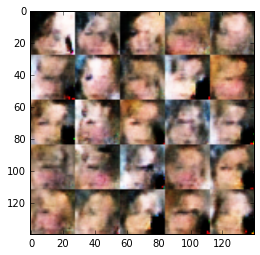

Epoch 1/2... Batch2800... Discriminator Loss: 1.3817... Generator Loss: 0.9701


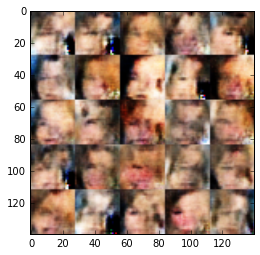

Epoch 1/2... Batch2900... Discriminator Loss: 1.3751... Generator Loss: 0.8795


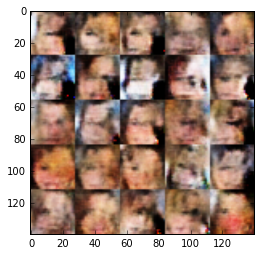

Epoch 1/2... Batch3000... Discriminator Loss: 1.3721... Generator Loss: 0.7898


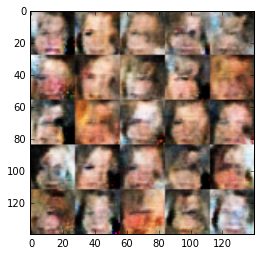

Epoch 1/2... Batch3100... Discriminator Loss: 1.3915... Generator Loss: 0.8574


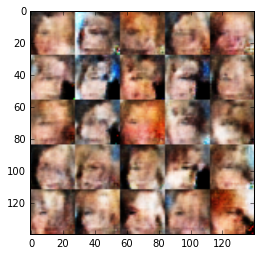

Epoch 2/2... Batch100... Discriminator Loss: 1.3777... Generator Loss: 0.8745


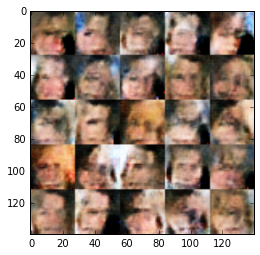

Epoch 2/2... Batch200... Discriminator Loss: 1.3709... Generator Loss: 0.7753


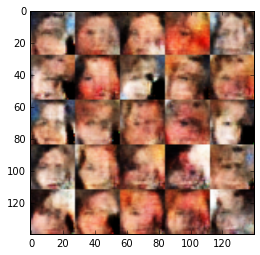

Epoch 2/2... Batch300... Discriminator Loss: 1.3734... Generator Loss: 0.8652


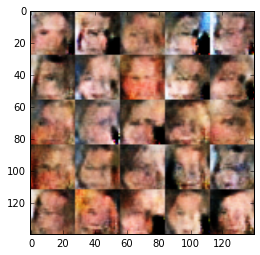

Epoch 2/2... Batch400... Discriminator Loss: 1.3723... Generator Loss: 0.8373


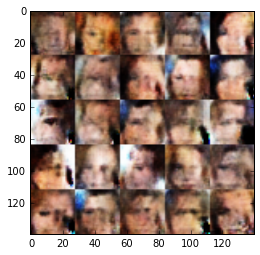

Epoch 2/2... Batch500... Discriminator Loss: 1.3916... Generator Loss: 0.8422


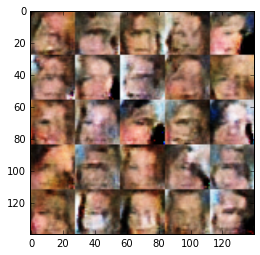

Epoch 2/2... Batch600... Discriminator Loss: 1.3764... Generator Loss: 0.8865


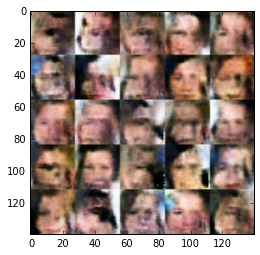

Epoch 2/2... Batch700... Discriminator Loss: 1.3754... Generator Loss: 0.8176


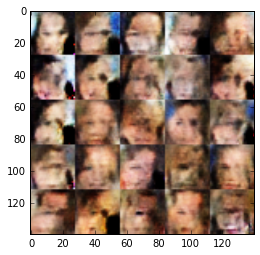

Epoch 2/2... Batch800... Discriminator Loss: 1.3718... Generator Loss: 0.7909


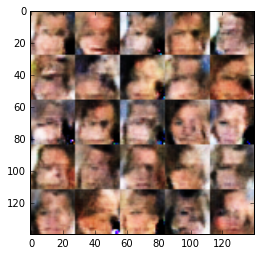

Epoch 2/2... Batch900... Discriminator Loss: 1.3846... Generator Loss: 0.7958


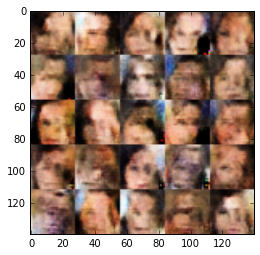

Epoch 2/2... Batch1000... Discriminator Loss: 1.3661... Generator Loss: 0.8598


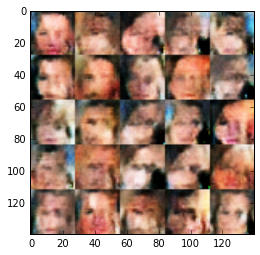

Epoch 2/2... Batch1100... Discriminator Loss: 1.3650... Generator Loss: 0.8444


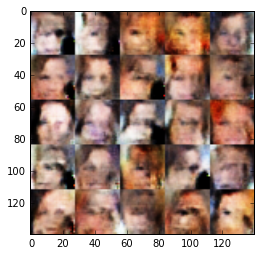

Epoch 2/2... Batch1200... Discriminator Loss: 1.3678... Generator Loss: 0.8279


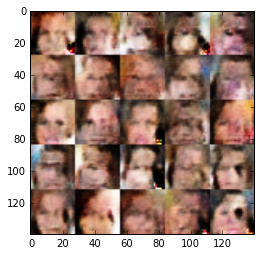

Epoch 2/2... Batch1300... Discriminator Loss: 1.3675... Generator Loss: 0.8462


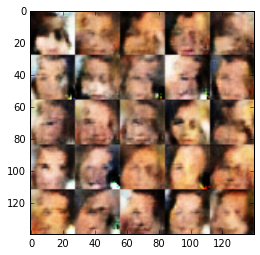

Epoch 2/2... Batch1400... Discriminator Loss: 1.3675... Generator Loss: 0.8089


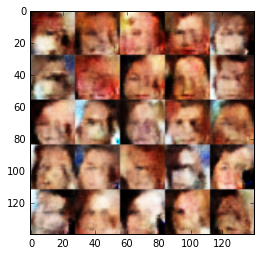

Epoch 2/2... Batch1500... Discriminator Loss: 1.3649... Generator Loss: 0.8451


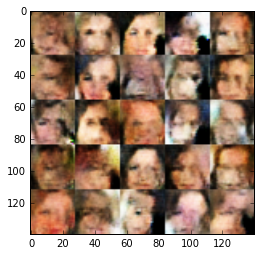

Epoch 2/2... Batch1600... Discriminator Loss: 1.3717... Generator Loss: 0.9062


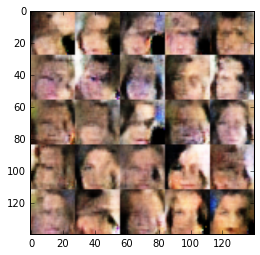

Epoch 2/2... Batch1700... Discriminator Loss: 1.3864... Generator Loss: 0.7875


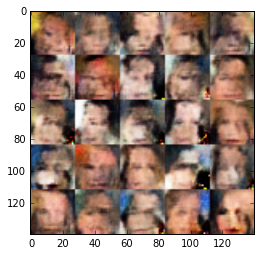

Epoch 2/2... Batch1800... Discriminator Loss: 1.3763... Generator Loss: 0.8342


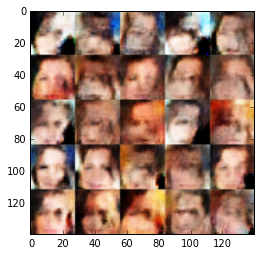

Epoch 2/2... Batch1900... Discriminator Loss: 1.3681... Generator Loss: 0.8155


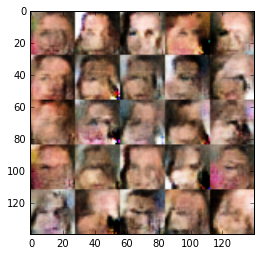

Epoch 2/2... Batch2000... Discriminator Loss: 1.3724... Generator Loss: 0.8166


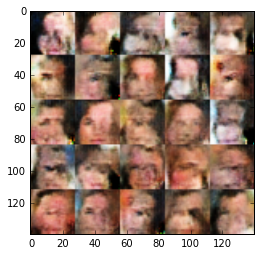

Epoch 2/2... Batch2100... Discriminator Loss: 1.3700... Generator Loss: 0.8378


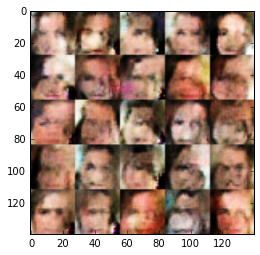

Epoch 2/2... Batch2200... Discriminator Loss: 1.3720... Generator Loss: 0.8533


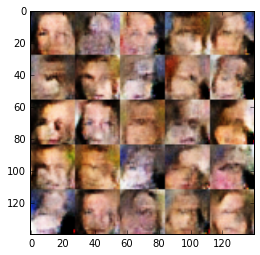

Epoch 2/2... Batch2300... Discriminator Loss: 1.3725... Generator Loss: 0.8447


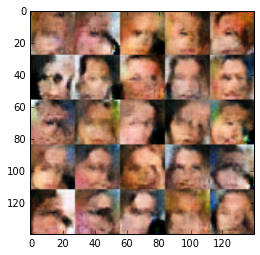

Epoch 2/2... Batch2400... Discriminator Loss: 1.3680... Generator Loss: 0.8223


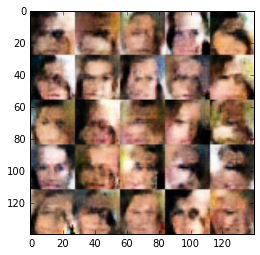

Epoch 2/2... Batch2500... Discriminator Loss: 1.3712... Generator Loss: 0.8214


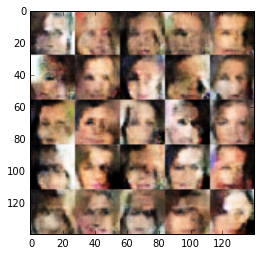

Epoch 2/2... Batch2600... Discriminator Loss: 1.3782... Generator Loss: 0.8406


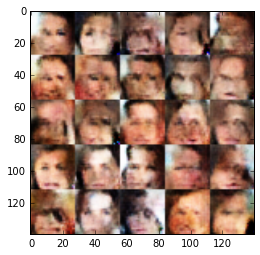

Epoch 2/2... Batch2700... Discriminator Loss: 1.3708... Generator Loss: 0.8618


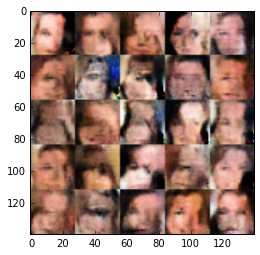

Epoch 2/2... Batch2800... Discriminator Loss: 1.3752... Generator Loss: 0.8309


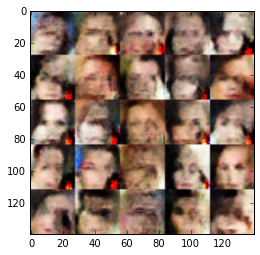

Epoch 2/2... Batch2900... Discriminator Loss: 1.3741... Generator Loss: 0.8240


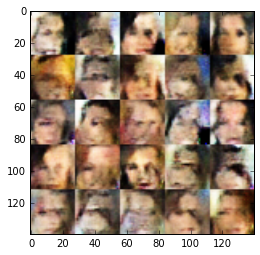

Epoch 2/2... Batch3000... Discriminator Loss: 1.3744... Generator Loss: 0.8329


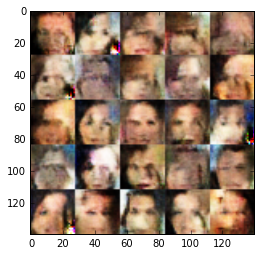

Epoch 2/2... Batch3100... Discriminator Loss: 1.3841... Generator Loss: 0.8246


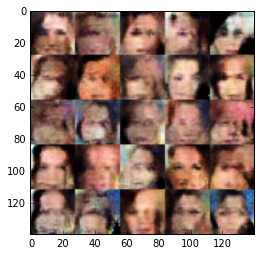

In [36]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

print("Start Generation")
celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.